In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import sklearn
from scipy.spatial.distance import euclidean
import cv2
from google.colab.patches import cv2_imshow
from scipy.spatial import ConvexHull
from scipy.stats import pearsonr

In [ ]:
df_lm=pd.read_csv('A002_02_BBP_NORMAL_color.txt')
df_lm.head()

,Frame,x1,y1,x2,y2,x3,y3,x4,y4,x5,...,x64,y64,x65,y65,x66,y66,x67,y67,x68,y68
0,159,192.072072,216.756757,185.405405,231.531532,182.702703,247.567568,183.809524,265.000000,188.095238,...,271.531532,262.342342,284.355917,269.031850,270.810811,264.684685,258.738739,263.243243,246.486486,263.063063
1,446,192.380952,220.000000,186.190476,236.666667,185.000000,253.809524,186.190476,273.571429,190.000000,...,275.675676,263.963964,285.765766,274.774775,272.972973,273.153153,259.819820,271.711712,247.027027,270.090090
2,455,190.952381,223.095238,185.952381,236.666667,184.523810,253.809524,185.045045,270.630631,189.047619,...,272.792793,268.288288,287.747748,272.792793,273.333333,265.945946,260.540541,265.945946,248.648649,265.585586
3,476,190.238095,221.666667,185.714286,236.428571,184.285714,254.285714,185.238095,273.095238,189.285714,...,274.774775,271.711712,287.207207,280.720721,273.153153,280.000000,260.360360,278.378378,247.747748,277.117117
4,184,189.761905,217.380952,185.952381,234.761905,185.000000,251.428571,187.380952,270.238095,192.857143,...,265.714286,257.619048,274.523810,262.380952,266.190476,264.285714,258.809524,265.000000,250.238095,263.333333


Displaying frame 159


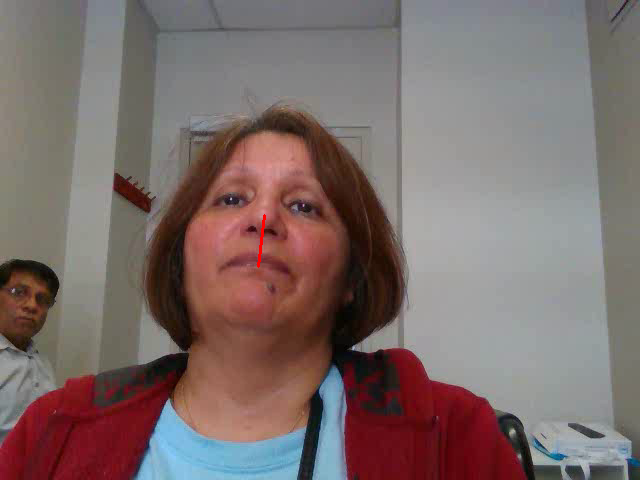

Displaying frame 446


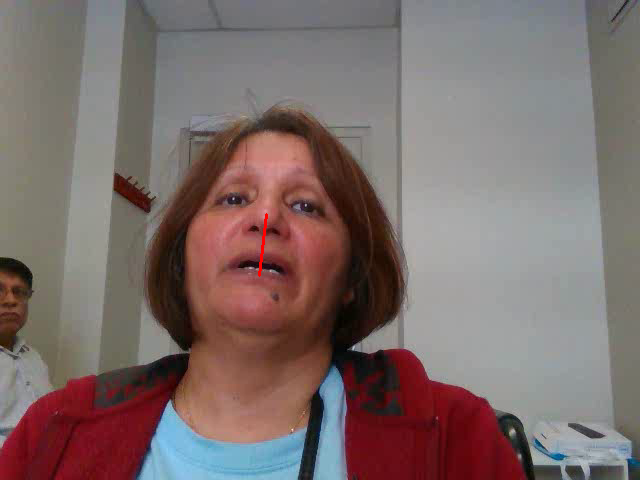

Displaying frame 455


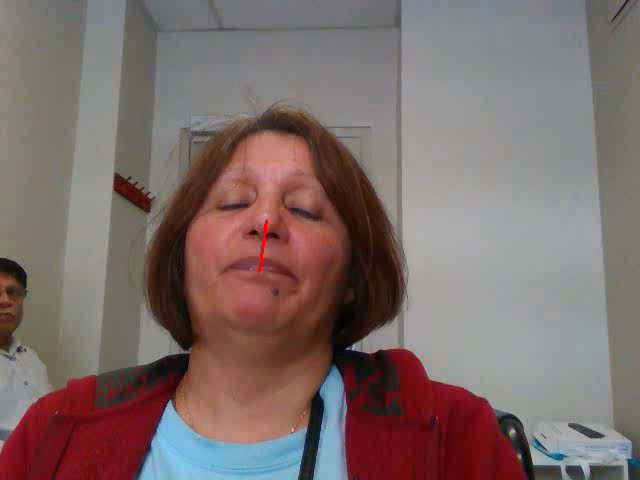

Displaying frame 476


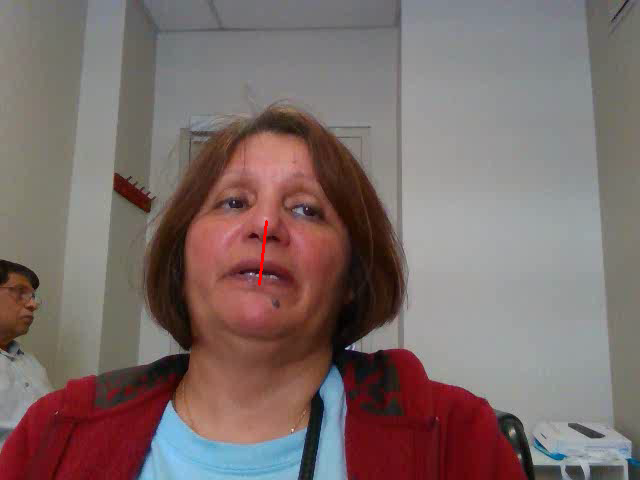

Displaying frame 184


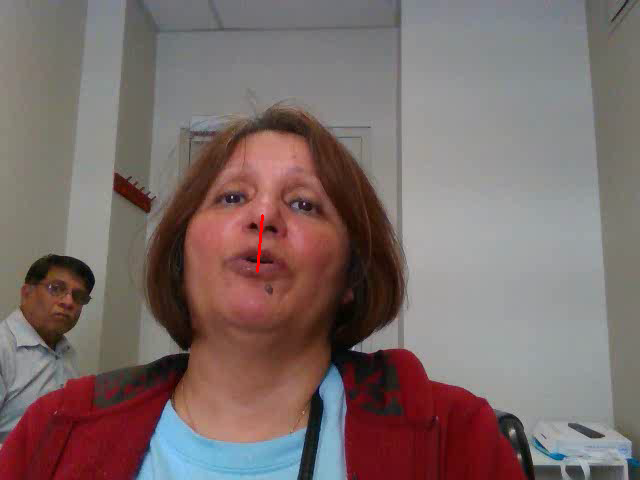

Displaying frame 204


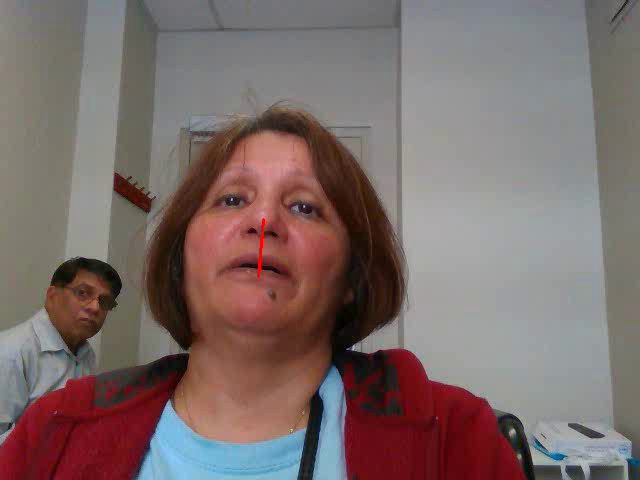

Displaying frame 209


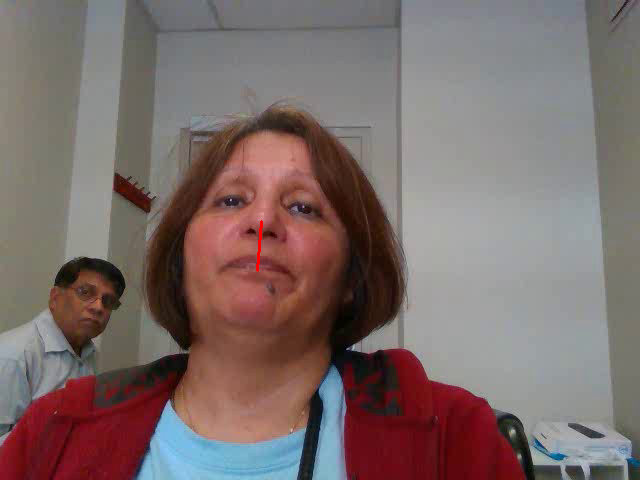

Displaying frame 232


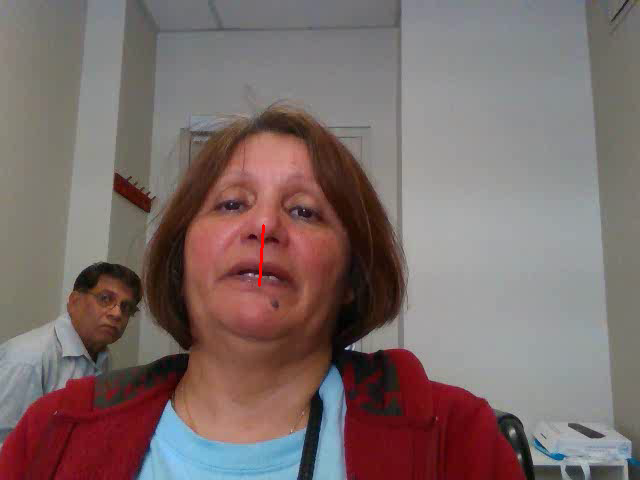

Displaying frame 280


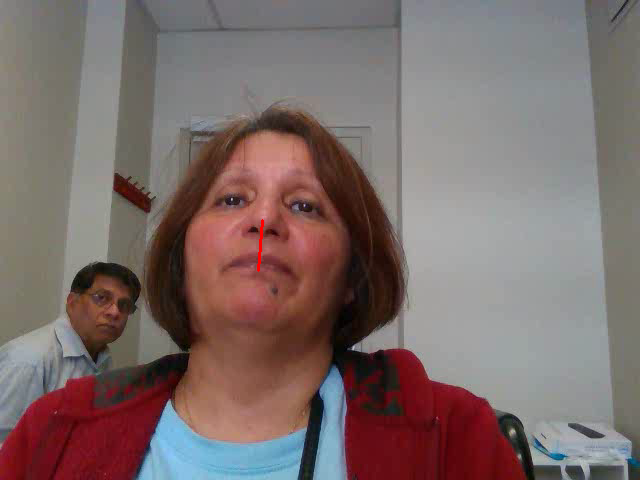

Displaying frame 305


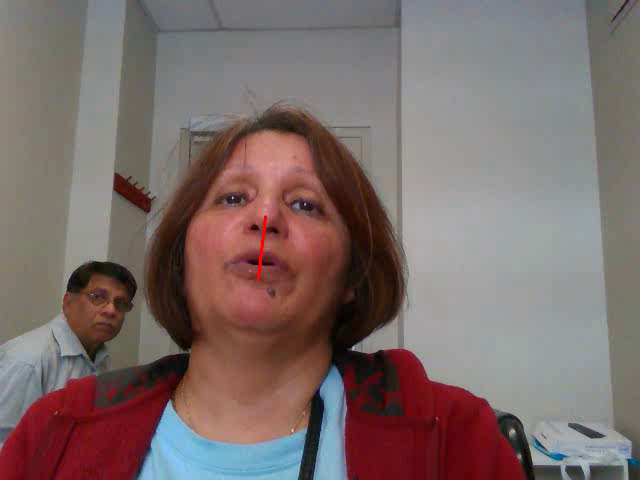

Displaying frame 325


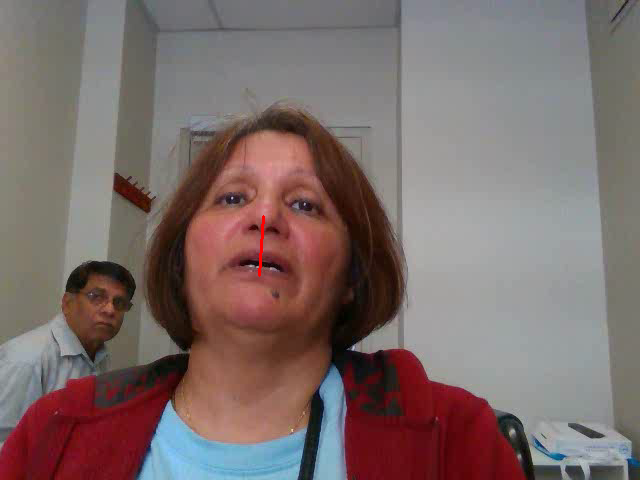

Displaying frame 332


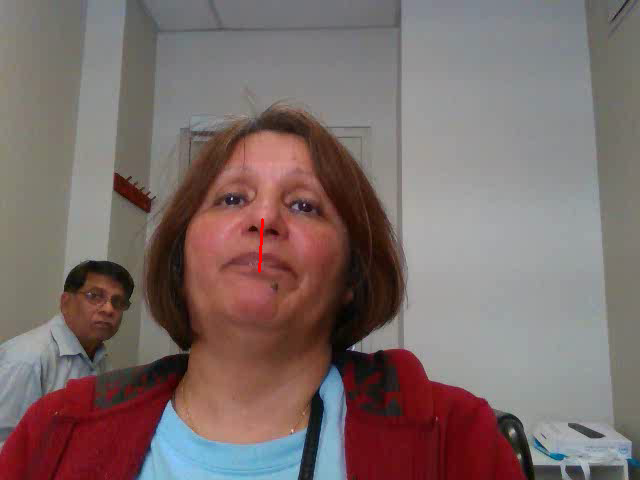

Displaying frame 355


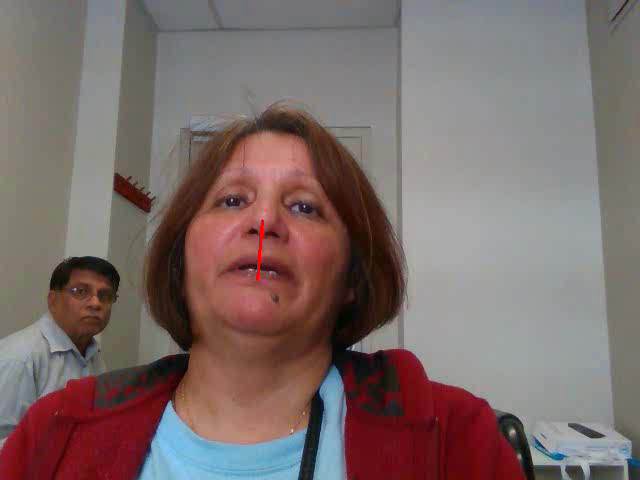

Displaying frame 399


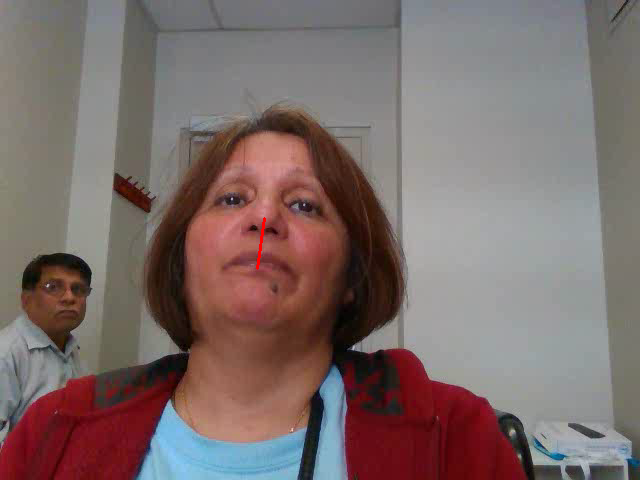

Displaying frame 427


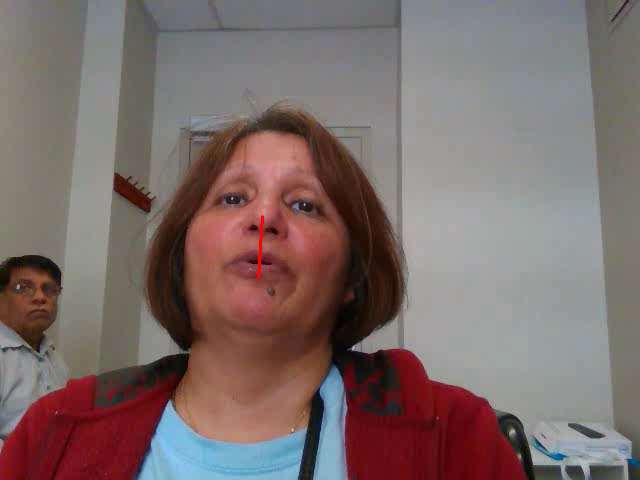

LLpath: 845.9781818806489


In [ ]:
distances = np.sqrt((df_lm[' x31'] - df_lm[' x58'])**2 + (df_lm[' y31'] - df_lm[' y58'])**2)
LLpath = distances.sum()
cap = cv2.VideoCapture('/content/A002_02_BBP_NORMAL_color.avi')
for index,row in df_lm.iterrows():
  frame_no = int(row['Frame'])
  cap.set(cv2.CAP_PROP_POS_FRAMES, frame_no)
  ret, frame = cap.read()
  cv2.line(frame,(int(row[' x31']),int(row[' y31'])),(int(row[' x58']),int(row[' y58'])),(0,0,255),2)
  print(f"Displaying frame {frame_no}")
  cv2_imshow(frame)
  cv2.waitKey(20)

cap.release()
print("LLpath:", LLpath)


In [ ]:
distances = np.sqrt((df_lm[' x31'] - df_lm[' x58'])**2 + (df_lm[' y31'] - df_lm[' y58'])**2)
LLpath = distances.sum()
print("LLpath:", LLpath)


LLpath: 845.9781818806489


Displaying frame 159


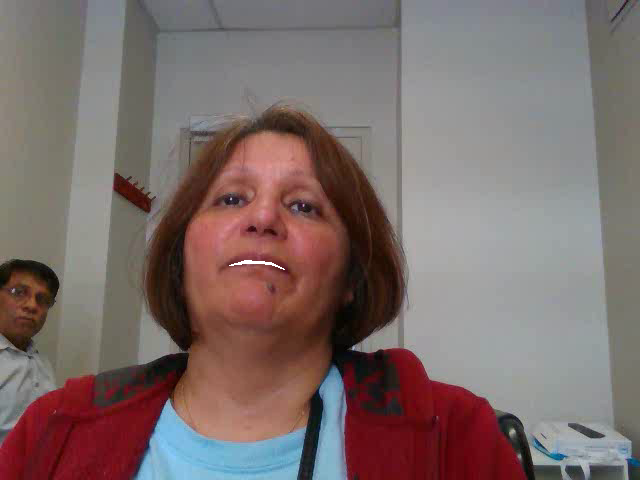

Displaying frame 446


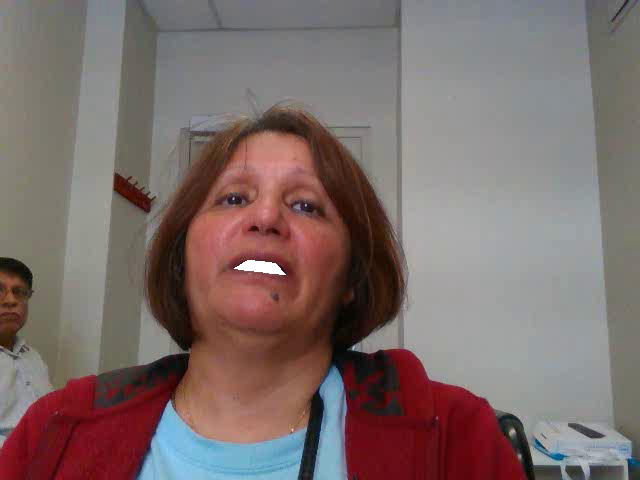

Displaying frame 455


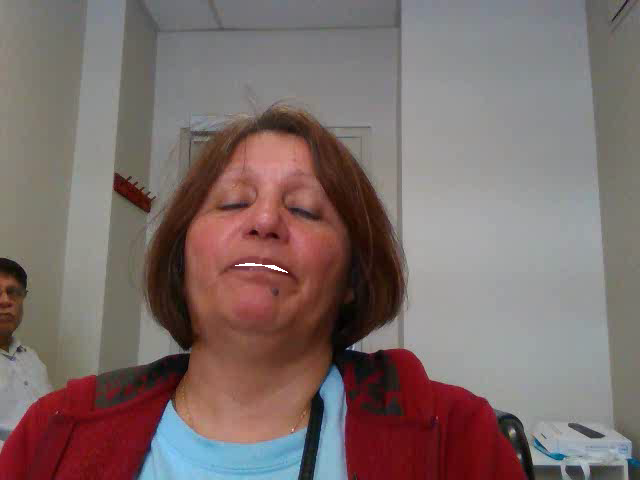

Displaying frame 476


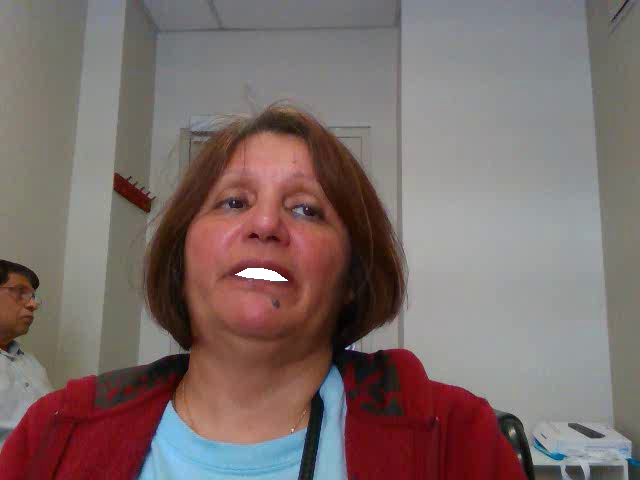

Displaying frame 184


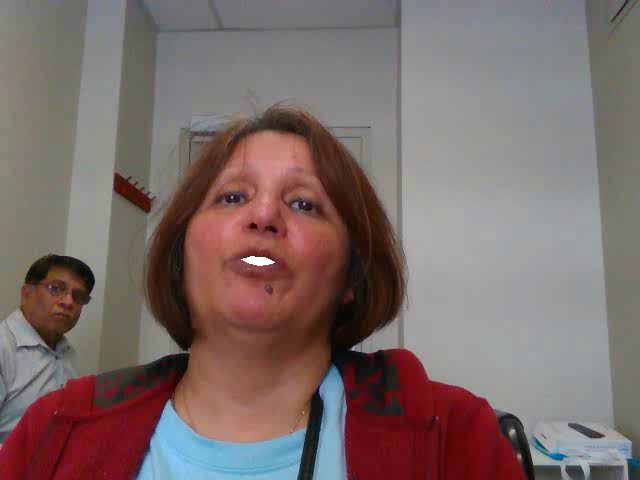

Displaying frame 204


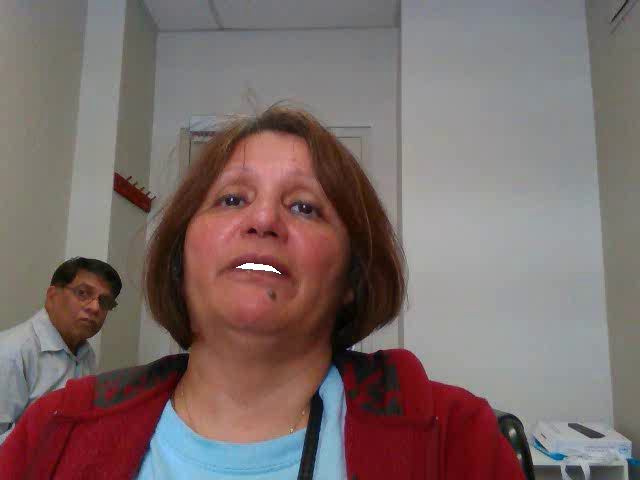

Displaying frame 209


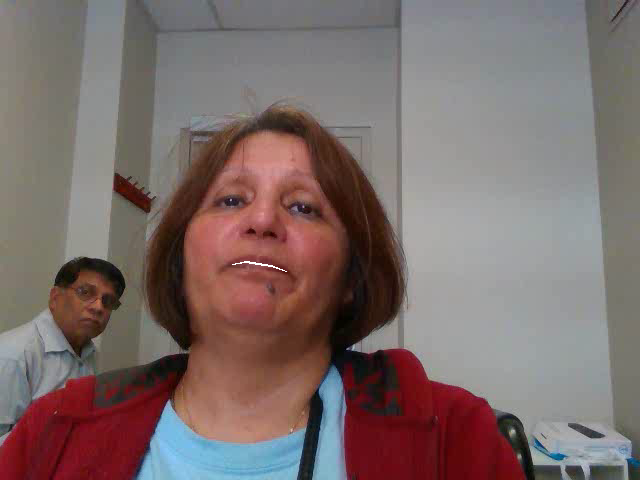

Displaying frame 232


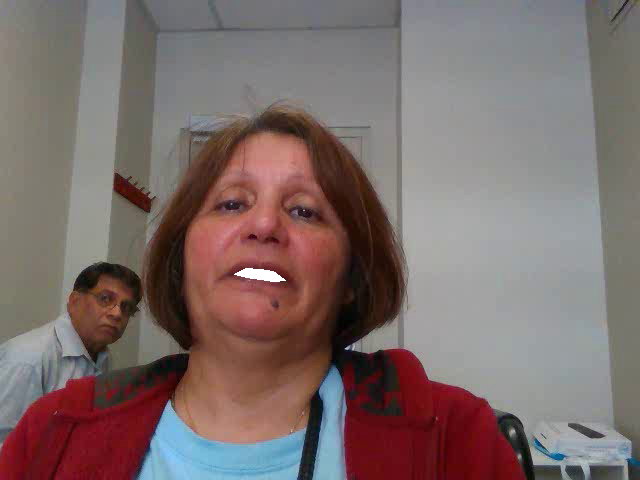

Displaying frame 280


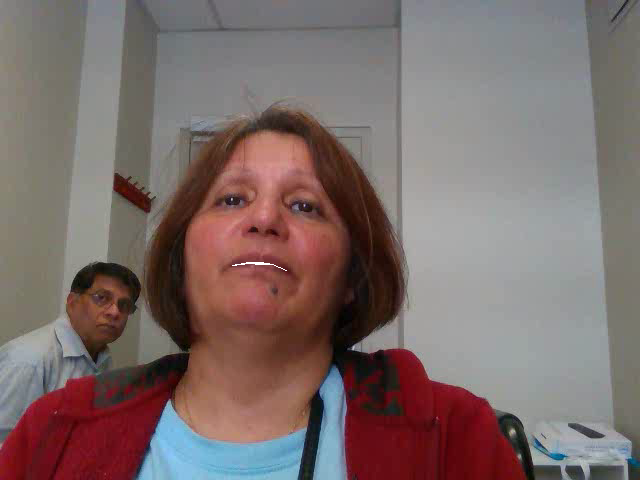

Displaying frame 305


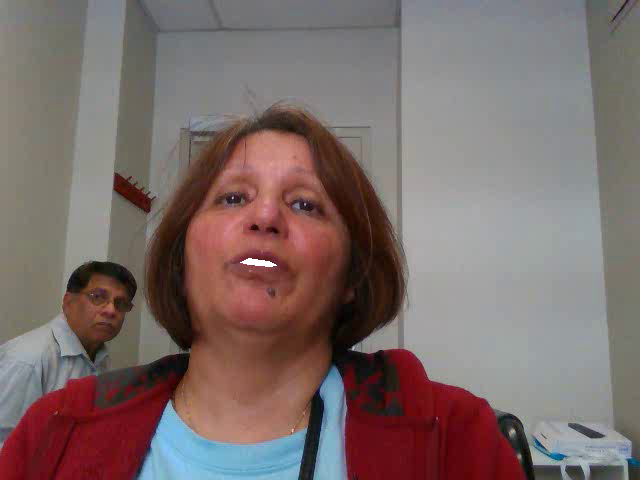

Displaying frame 325


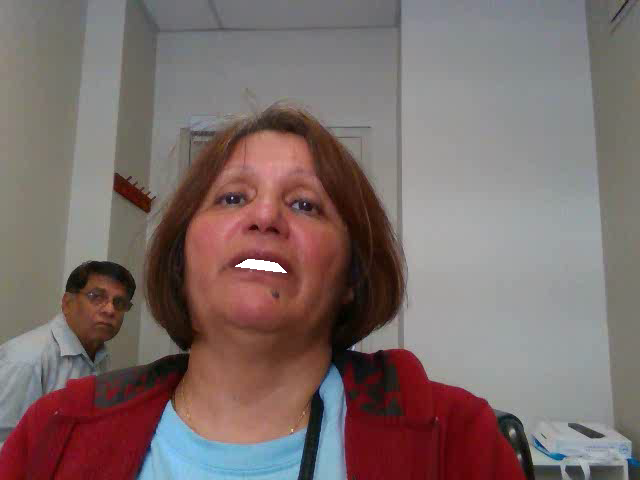

Displaying frame 332


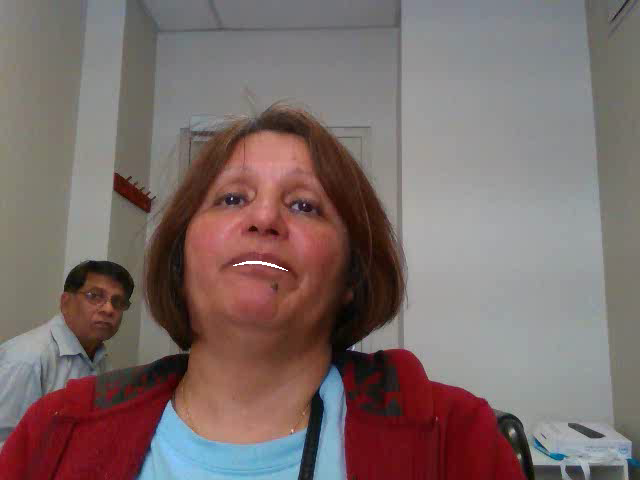

Displaying frame 355


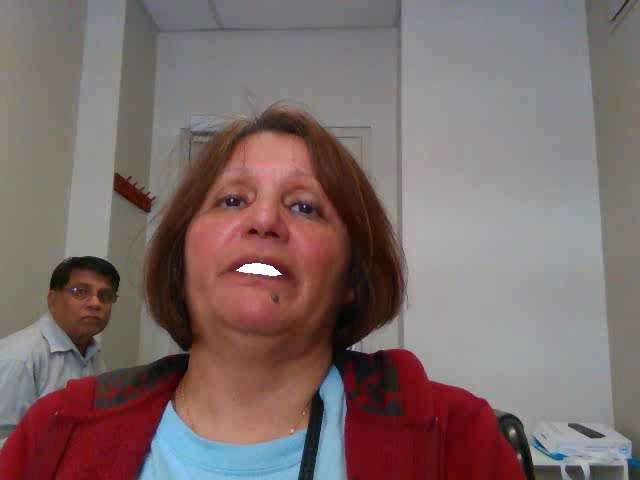

Displaying frame 399


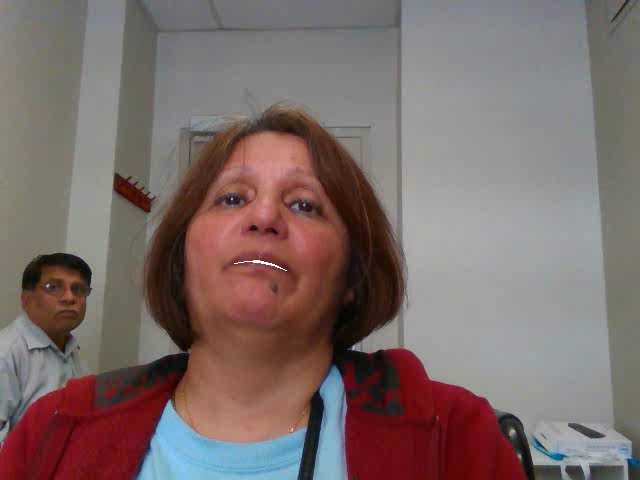

Displaying frame 427


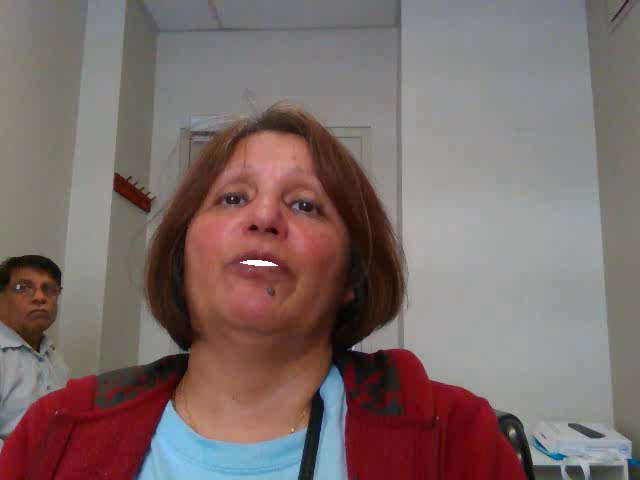

Area of polygons: [247.50000000000097, 408.0, 171.00000000000026, 374.99999999999983, 179.49999999999977, 197.4999999999994, 174.9999999999995, 380.4999999999991, 191.00000000000048, 154.49999999999955, 346.500000000001, 218.00000000000108, 330.0000000000004, 186.9999999999988, 116.00000000000021]
Range of area: 291.9999999999998
Mean of area: 245.1333333333333


In [ ]:
cap = cv2.VideoCapture('/content/A002_02_BBP_NORMAL_color.avi')
area = []
df_lm.columns = df_lm.columns.str.strip()

for index, row in df_lm.iterrows():
    frame_no = int(row['Frame'])
    cap.set(cv2.CAP_PROP_POS_FRAMES, frame_no)
    ret, frame = cap.read()
    points = np.array([
        (row['x61'], row['y61']),
        (row['x62'], row['y62']),
        (row['x63'], row['y63']),
        (row['x64'], row['y64']),
        (row['x65'], row['y65']),
        (row['x66'], row['y66']),
        (row['x67'], row['y67']),
        (row['x68'], row['y68'])
    ], dtype=np.int32)
    points = points.reshape((-1, 1, 2))

    cv2.fillPoly(frame, [points], (255, 255, 255))
    print(f"Displaying frame {frame_no}")
    cv2_imshow(frame)
    cv2.waitKey(20)

    hull = ConvexHull(points[:, 0, :])  # Pass 2D points
    area.append(hull.volume)

cap.release()

print("Area of polygons:", area)
print("Range of area:", max(area) - min(area))
print("Mean of area:", np.mean(area))


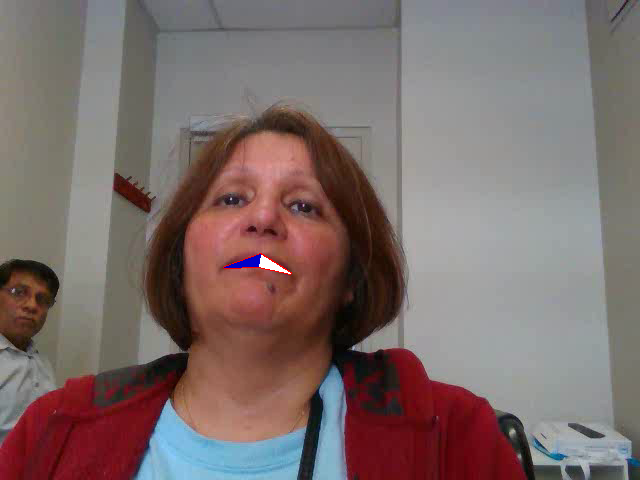

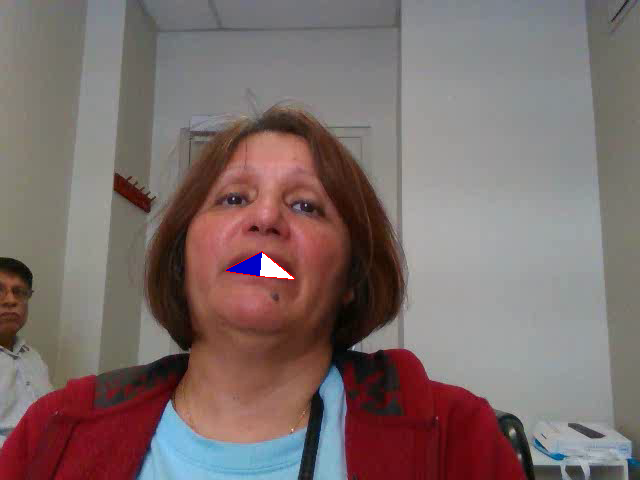

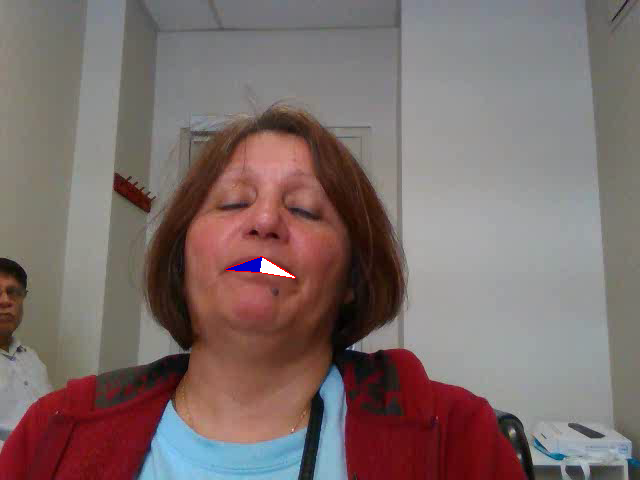

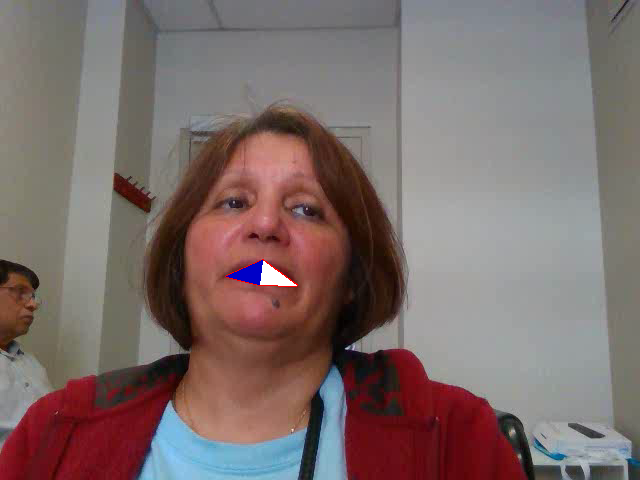

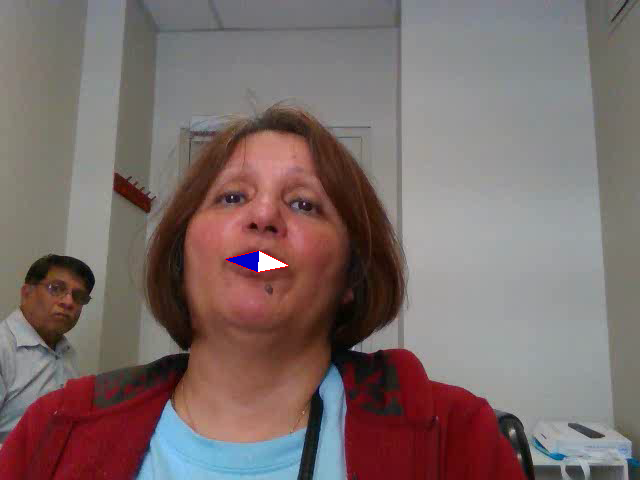

...

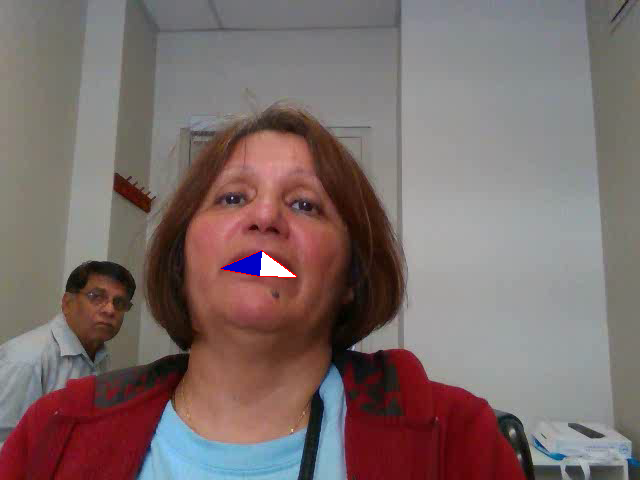

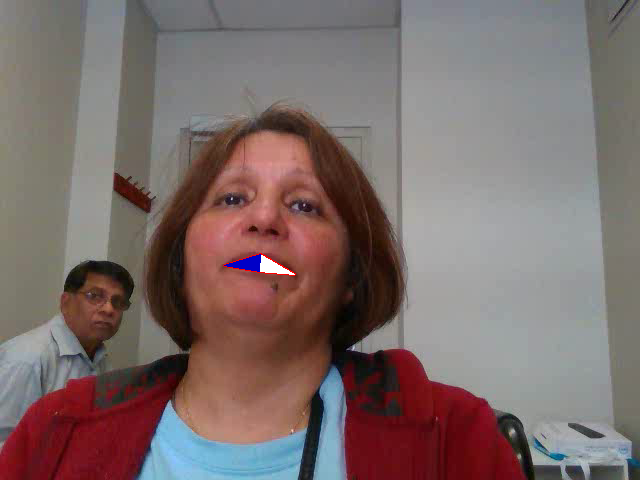

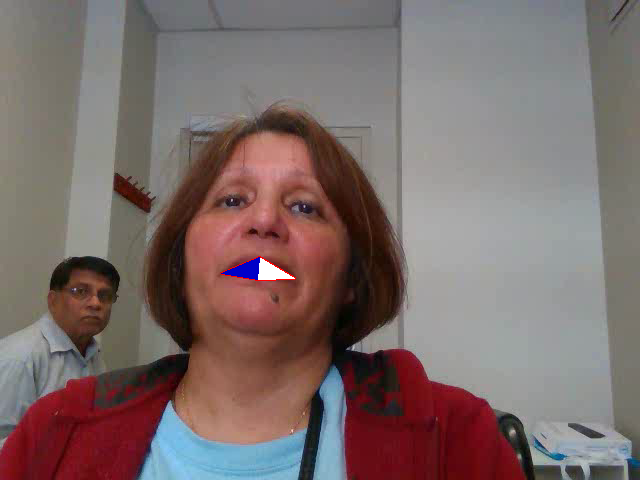

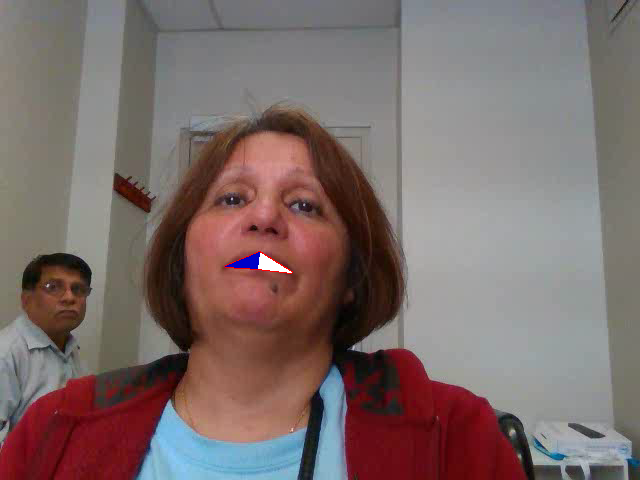

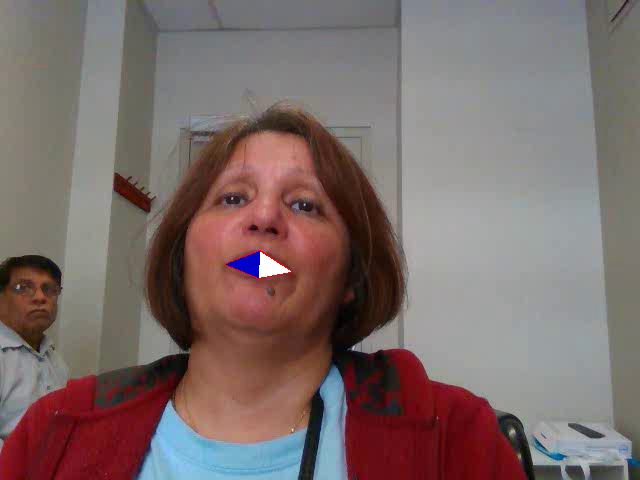

377.0666666666667


In [ ]:
#symmentry
cap=cv2.VideoCapture('/content/A002_02_BBP_NORMAL_color.avi')
Larea=[]
Rarea=[]
for index,row in df_lm.iterrows():
  frame_no=int(row['Frame'])
  cap.set(cv2.CAP_PROP_POS_FRAMES,frame_no)
  ret,frame=cap.read()
  Larea.append(0.5 * abs((int(row['x52'])*(int(row['y55'])-(int(row['y58']))))+(int(row['x55'])*(int(row['y58'])-(int(row['x52']))))+(int(row['x58'])*(int(row['y52'])-(int(row['y55']))))))
  Rarea.append(0.5 * abs((int(row['x52'])*(int(row['y49'])-(int(row['y58']))))+(int(row['x49'])*(int(row['y58'])-(int(row['x52']))))+(int(row['x58'])*(int(row['y52'])-(int(row['y49']))))))
  cv2.line(frame,(int(row['x52']),int(row['y52'])),(int(row['x58']),int(row['y58'])),(0,0,255),2)
  cv2.line(frame,(int(row['x52']),int(row['y52'])),(int(row['x55']),int(row['y55'])),(0,0,255),2)
  cv2.line(frame,(int(row['x55']),int(row['y55'])),(int(row['x58']),int(row['y58'])),(0,0,255),2)
  cv2.line(frame,(int(row['x49']),int(row['y49'])),(int(row['x58']),int(row['y58'])),(0,0,255),2)
  cv2.line(frame,(int(row['x49']),int(row['y49'])),(int(row['x52']),int(row['y52'])),(0,0,255),2)
  points1=np.array([(int(row['x52']),int(row['y52'])),(int(row['x58']),int(row['y58'])),(int(row['x55']),int(row['y55']))])
  points2=np.array([(int(row['x52']),int(row['y52'])),(int(row['x58']),int(row['y58'])),(int(row['x49']),int(row['y49']))])
  cv2.fillPoly(frame,[points1],(255,255,255))
  cv2.fillPoly(frame,[points2],(200,0,0))
  cv2_imshow(frame)
  cv2.waitKey(20)

cap.release()
Adiff=abs(np.mean(Larea)-np.mean(Rarea))
print(Adiff)



In [ ]:
df = pd.DataFrame()
df['W'] = np.sqrt((df_lm['x49'] - df_lm['x55'])**2 + (df_lm['y49'] - df_lm['y55'])**2)  # Mouth width
df['LLdisp'] = np.sqrt((df_lm['x52'] - df_lm['x58'])**2 + (df_lm['y52'] - df_lm['y58'])**2)
df['vW'] = df['W'].diff()
df['vLL'] = df['LLdisp'].diff()

df['e']=np.sqrt(1-df['LLdisp']**2/df['W']**2)
print("Frame-wise calculations:")
print(df[['W', 'LLdisp', 'vW', 'vLL','e']])
vWmax = df['vW'].max()
vWmin = df['vW'].min()
vLLmax = df['vLL'].max()
vLLmin = df['vLL'].min()

print("Features:")
print(f"vWmax (Max velocity of mouth width): {vWmax}")
print(f"vWmin (Min velocity of mouth width): {vWmin}")
print(f"vLLmax (Max velocity of LL displacement): {vLLmax}")
print(f"vLLmin (Min velocity of LL displacement): {vLLmin}")
print(f"range of e: {max(df['e'])-min(df['e'])}")
print(f"mean of e: {np.mean(df['e'])}")


Frame-wise calculations:
            W     LLdisp         vW        vLL         e
0   66.236746  11.898586        NaN        NaN  0.983733
1   67.473328  22.805430   1.236582  10.906844  0.941149
2   68.756777  14.347819   1.283449  -8.457611  0.977985
3   71.033965  24.182436   2.277188   9.834617  0.940268
4   60.531471  20.050955 -10.502494  -4.131480  0.943544
5   67.128502  20.488645   6.597032   0.437690  0.952283
6   71.808908  14.555002   4.680406  -5.933644  0.979243
7   75.724767  23.106281   3.915859   8.551279  0.952309
8   68.894740  16.095661  -6.830027  -7.010620  0.972326
9   64.320978  26.196969  -4.573762  10.101308  0.913301
10  74.515061  24.165201  10.194083  -2.031768  0.945954
11  70.582288  16.946628  -3.932773  -7.218572  0.970749
12  72.807717  21.223890   2.225429   4.277262  0.956569
13  65.746197  15.759315  -7.061521  -5.464575  0.970847
14  64.867299  25.768241  -0.878898  10.008926  0.917712
Features:
vWmax (Max velocity of mouth width): 10.1940831197736

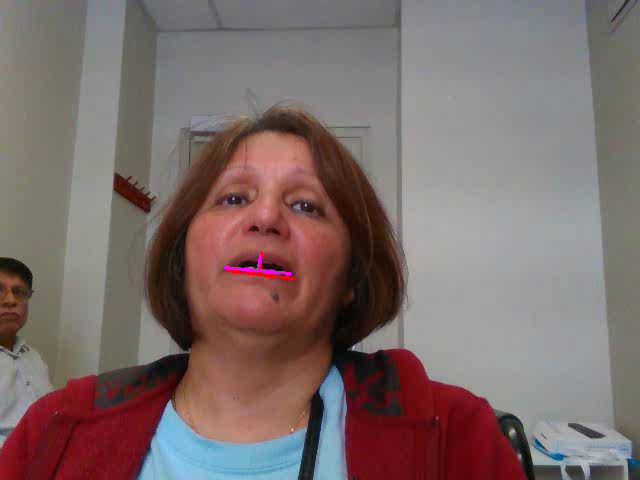

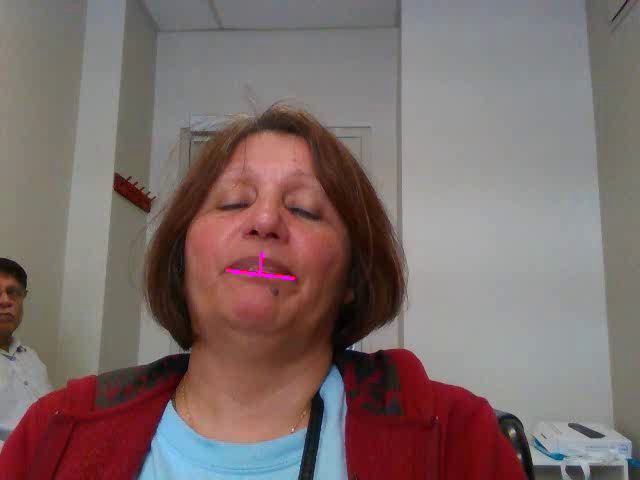

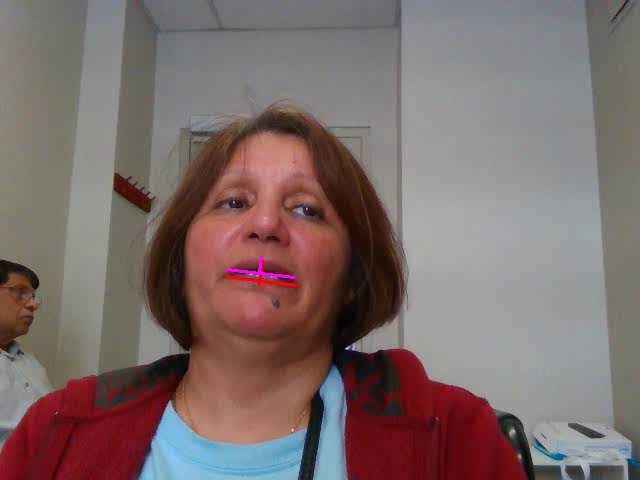

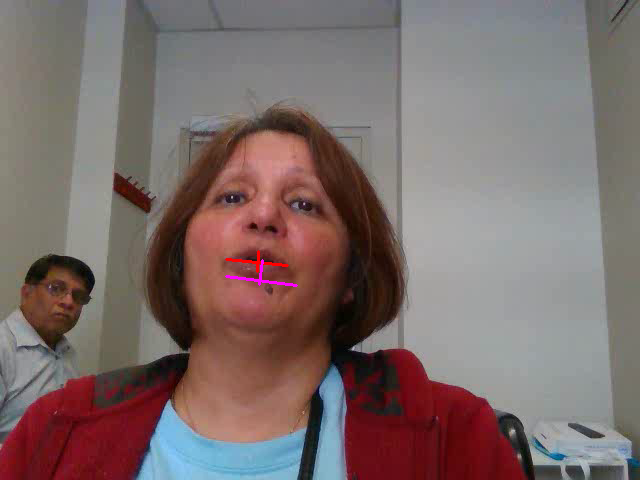

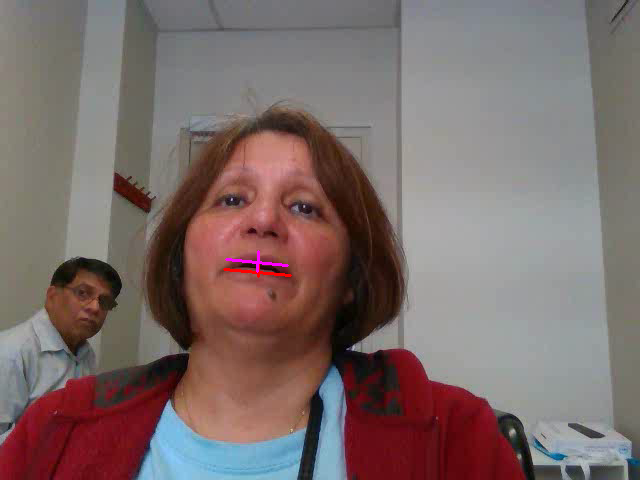

...

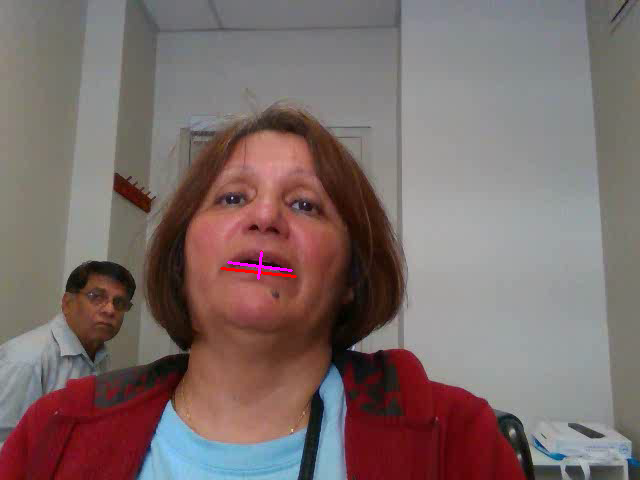

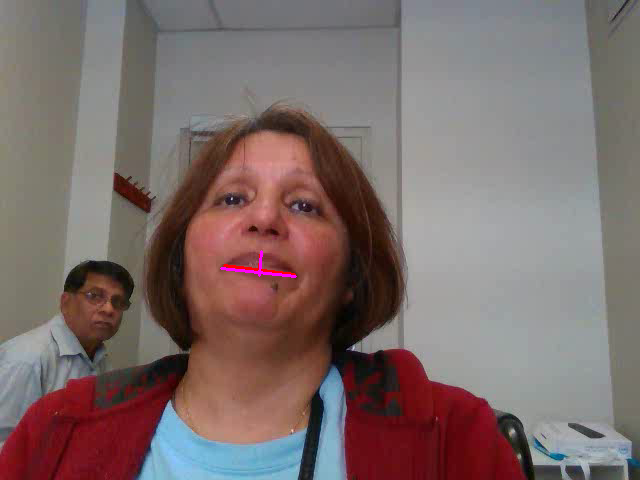

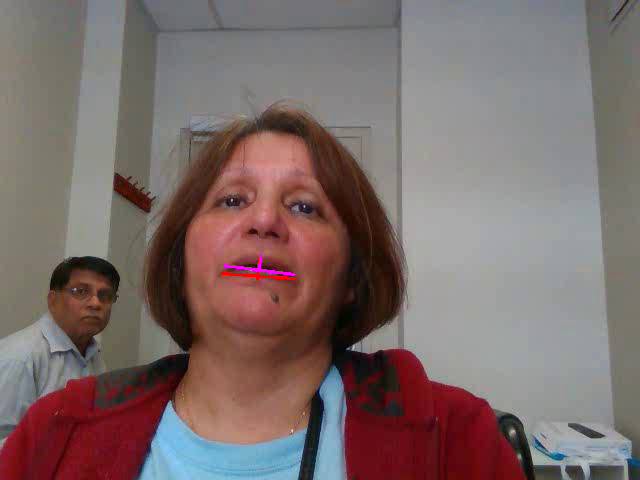

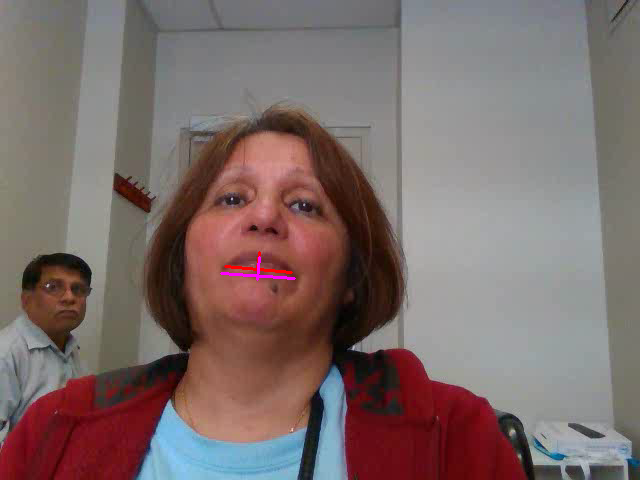

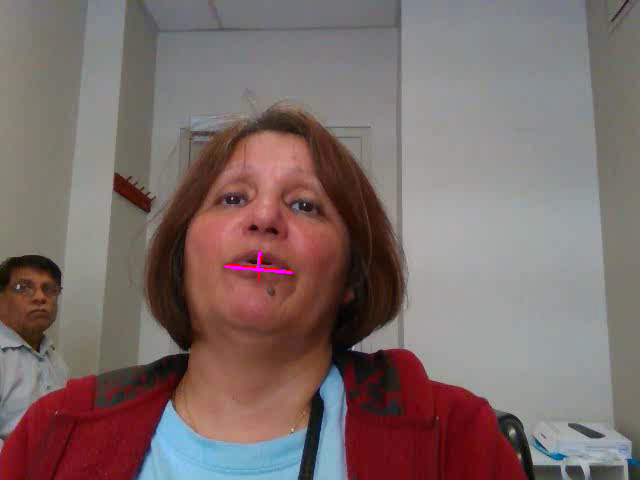

In [ ]:
cap=cv2.VideoCapture('/content/A002_02_BBP_NORMAL_color.avi')
df_lm.columns = df_lm.columns.str.strip()
df_lm1=df_lm.astype(int)
for index, row in df_lm1.iterrows():
  if index==0:
    continue
  frame_no = row['Frame']
  cap.set(cv2.CAP_PROP_POS_FRAMES, frame_no)
  ret, frame = cap.read()
  x1_cr, y1_cr = df_lm1.loc[df_lm1['Frame'] == frame_no, ['x52', 'y52']].values[0]
  x2_cr, y2_cr = df_lm1.loc[df_lm1['Frame'] == frame_no, ['x58', 'y58']].values[0]
  x3_cr, y3_cr = df_lm1.loc[df_lm1['Frame'] == frame_no, ['x49', 'y49']].values[0]
  x4_cr, y4_cr = df_lm1.loc[df_lm1['Frame'] == frame_no, ['x55', 'y55']].values[0]

  x1_prev, y1_prev = df_lm1.loc[df_lm1['Frame'] == df_lm1['Frame'][index-1], ['x52', 'y52']].values[0]
  x2_prev, y2_prev = df_lm1.loc[df_lm1['Frame'] == df_lm1['Frame'][index-1], ['x58', 'y58']].values[0]
  x3_prev, y3_prev = df_lm1.loc[df_lm1['Frame'] == df_lm1['Frame'][index-1], ['x49', 'y49']].values[0]
  x4_prev, y4_prev = df_lm1.loc[df_lm1['Frame'] == df_lm1['Frame'][index-1], ['x55', 'y55']].values[0]



  cv2.line(frame,(x1_cr,y1_cr),(x2_cr,y2_cr),(0,0,255),2)
  cv2.line(frame,(x3_cr,y3_cr),(x4_cr,y4_cr),(0,0,255),2)
  cv2.line(frame,(x1_prev,y1_prev),(x2_prev,y2_prev),(255,0,255),2)
  cv2.line(frame,(x3_prev,y3_prev),(x4_prev,y4_prev),(255,0,255),2)
  cv2_imshow(frame)
  cv2.waitKey(0)

cap.release()




In [ ]:
from scipy.stats import pearsonr


# Calculate displacements
df['disp_RC'] = np.sqrt((df_lm['x49'] - df_lm['x31'])**2 + (df_lm['y49'] - df_lm['y31'])**2)
df['disp_LC'] = np.sqrt((df_lm['x55'] - df_lm['x31'])**2 + (df_lm['y55'] - df_lm['y31'])**2)

# Calculate Pearson's correlation coefficient
r_symm, _ = pearsonr(df['disp_RC'], df['disp_LC'])

# Display results
print("Frame-wise Displacements:")
print(df[['disp_RC', 'disp_LC']])
print(f"\nSymmetry Index (r_symm): {r_symm:.4f}")


Frame-wise Displacements:
      disp_RC    disp_LC
0   65.468850  63.257318
1   68.806421  69.037465
2   63.439770  63.679262
3   67.749053  70.975525
4   56.967986  56.541478
5   64.109105  62.292740
6   61.954650  62.489908
7   67.495276  68.809524
8   62.506689  62.843162
9   58.751658  60.160877
10  66.674319  67.955234
11  60.330251  63.435739
12  66.865350  66.165206
13  60.945870  59.842954
14  60.571728  62.080794

Symmetry Index (r_symm): 0.9154


In [ ]:
import os
import cv2
import pandas as pd

# Initialize lists and DataFrame
area = []
frames = []
subject_ids = []
Arest = pd.DataFrame()

base_dir = "/content/drive/MyDrive/neuro_data/Neuroface"
categories = ["HC", "PS", "ALS"]

for category in categories:
    landmark_dir = os.path.join(base_dir, category, "Landmarks_gt")
    video_dir = os.path.join(base_dir, category, "Videos")  # Directory containing videos/images

    for file_name in os.listdir(landmark_dir):
        if file_name.endswith(".txt"):
            parts = file_name.split('_')
            if len(parts) >= 4:
                task_name = parts[3].upper()
                subject_id = parts[0]

                if task_name == 'KISS':
                    file_path = os.path.join(landmark_dir, file_name)

                    # Read the landmarks
                    df = pd.read_csv(file_path,nrows=1)
                    df.columns = df.columns.str.strip()

                    # Load corresponding video/image file
                    video_file = os.path.join(video_dir, f"{subject_id}_02_NSM_KISS_color.avi")  # Example naming convention
                    if not os.path.exists(video_file):
                        print(f"Video for {subject_id}_{task_name} not found.")
                        continue

                    cap = cv2.VideoCapture(video_file)
                    for index, row in df.iterrows():
                        # Calculate area
                        calculated_area = (0.5 * abs(
                            (row['x52'] * (row['y55'] - row['y58'])) +
                            (row['x55'] * (row['y58'] - row['y52'])) +
                            (row['x58'] * (row['y52'] - row['y55']))
                        )) + (0.5 * abs(
                            (row['x52'] * (row['y49'] - row['y58'])) +
                            (row['x49'] * (row['y58'] - row['y52'])) +
                            (row['x58'] * (row['y52'] - row['y49']))
                        ))

                        area.append(calculated_area)
                        frames.append(index)  # Save frame index
                        subject_ids.append(subject_id)

                        # Seek to the specific frame
                        cap.set(cv2.CAP_PROP_POS_FRAMES, index)
                        ret, frame = cap.read()
                        if not ret:
                            print(f"Frame {index} not found in {video_file}.")
                            continue

                        # Display the frame
                        print(f"Frame {index} - {subject_id}")
                        cv2_imshow(frame)
                        key = cv2.waitKey(0)  # Wait for a key press to continue
                        if key == ord('q'):  # Quit visualization on 'q' press
                            break

                    cap.release()
                    cv2.destroyAllWindows()

# Create a DataFrame
Arest = pd.DataFrame({
    'Subject_ID': subject_ids,
    'Frame': frames,
    'Area': area
})

print(Arest)


Output hidden; open in https://colab.research.google.com to view.

In [ ]:
area=[]
Arest = pd.DataFrame()
base_dir = "/content/drive/MyDrive/neuro_data/Neuroface"
categories = ["HC", "PS", "ALS"]

for category in categories:
    landmark_dir = os.path.join(base_dir, category, "Landmarks_gt")

    for file_name in os.listdir(landmark_dir):
        if file_name.endswith(".txt"):
            parts = file_name.split('_')
            if len(parts) >= 4:
                task_name = parts[3].upper()
                subject_id = parts[0]
                if task_name == 'KISS':
                  file_path = os.path.join(landmark_dir, file_name)
                  df = pd.read_csv(file_path,nrows=1)
                  df.columns=df.columns.str.strip()
                  for index, row in df.iterrows():
                      area.append((0.5 * abs(
                          (row['x52'] * (row['y55'] - row['y58'])) +
                          (row['x55'] * (row['y58'] - row['y52'])) +
                          (row['x58'] * (row['y52'] - row['y55']))
                      ))+(0.5 * abs(
                          (row['x52'] * (row['y49'] - row['y58'])) +
                          (row['x49'] * (row['y58'] - row['y52'])) +
                          (row['x58'] * (row['y52'] - row['y49']))
                      )))


                # Add the frame count to df_frame as a new row
                # Arest = pd.concat([Arest, pd.DataFrame({'Subject_ID':[subject_id],'Arest':[area]})],ignore_index=True)
print(area)


[778.6527201760632, 518.031157222797, 454.16666666666674, 544.5578231292518, 624.4947650353058, 199.79379219954785, 281.308335362389, 667.26494834603, 234.41043083900354, 822.7903579254914, 432.69080997727383, 494.0541440297038, 872.1532343153972, 744.1928414901379, 422.52328859472055, 1383.1994156318488, 309.0419501133797, 923.8048859670471, 726.4630238266253, 381.8196574953329, 513.8659320477516, 505.93295998701365, 915.2815335616845, 808.7633087633094, 414.18732782369256, 146.2373183994805, 524.2346938775511, 580.1639477315164, 589.15672429186, 309.81695717474076, 499.11208505802927, 505.41352162973726, 714.3085891702837, 458.7640203952586, 250.24348672997473, 310.3968833698576]


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
Arest.columns

Index(['Subject_ID', 'Frame', 'Area'], dtype='object')

In [ ]:
Arest.reset_index(drop=True,inplace=True)
Arest=Arest.set_index('Subject_ID')
Arest.drop(columns='Frame')

,Area
Subject_ID,
N002,778.652720
N003,518.031157
N001,454.166667
N011,544.557823
N010,624.494765
N008,199.793792
N017,281.308335
N004,667.264948
N019,234.410431


In [ ]:
import os
import pandas as pd
import numpy as np
from scipy.spatial import ConvexHull
from scipy.stats import pearsonr

# Functions
def calculate_LLpath(df_lm):
    distances = np.sqrt((df_lm['x31'] - df_lm['x58'])**2 + (df_lm['y31'] - df_lm['y58'])**2)
    LLpath = distances.sum()
    return LLpath

# def calculate_area(df_lm):
#     area = []
#     for index, row in df_lm.iterrows():
#         points = np.array([
#             (row['x61'], row['y61']),
#             (row['x62'], row['y62']),
#             (row['x63'], row['y63']),
#             (row['x64'], row['y64']),
#             (row['x65'], row['y65']),
#             (row['x66'], row['y66']),
#             (row['x67'], row['y67']),
#             (row['x68'], row['y68'])
#         ], dtype=np.int32)
#         unique_points = np.unique(points, axis=0)


#         if len(unique_points) < 3:
#             area.append(0)
#             continue

#         if np.linalg.matrix_rank(unique_points - unique_points[0]) < 2:
#             area.append(0)  # Default area for degenerate cases
#             continue

#         # Compute ConvexHull
#         try:
#             hull = ConvexHull(unique_points)
#             area.append(hull.volume)  # ConvexHull.volume gives area in 2D
#         except Exception as e:
#             print(f"Error computing ConvexHull: {e}")
#             area.append(0)

#     range_area = max(area) - min(area) if area else 0
#     mean_area = np.mean(area) if area else 0
#     return range_area, mean_area

def calculate_Area(df_lm,Arest,subject_id):
    area=[]
    for index, row in df_lm.iterrows():
        area.append((((0.5 * abs(
            (row['x52'] * (row['y55'] - row['y58'])) +
            (row['x55'] * (row['y58'] - row['y52'])) +
            (row['x58'] * (row['y52'] - row['y55']))
        ))+(0.5 * abs(
            (row['x52'] * (row['y49'] - row['y58'])) +
            (row['x49'] * (row['y58'] - row['y52'])) +
            (row['x58'] * (row['y52'] - row['y49']))
        ))-Arest['Area'][subject_id])/Arest['Area'][subject_id])*100)
    Amean=np.mean(area)
    Arange=max(area)-min(area)
    return Amean,Arange

def calculate_Adiff(df_lm):
    Adiff=[]
    for index, row in df_lm.iterrows():
      Adiff.append(0.5*abs(
            (row['x52'] * (row['y55'] - row['y58'])) +
            (row['x55'] * (row['y58'] - row['y52'])) +
            (row['x58'] * (row['y52'] - row['y55']))
        )-(0.5 * abs(
            (row['x52'] * (row['y49'] - row['y58'])) +
            (row['x49'] * (row['y58'] - row['y52'])) +
            (row['x58'] * (row['y52'] - row['y49'])))))
    Adiff=np.mean(Adiff)
    return Adiff

def calculate_framewise_features(df_lm):
    df = pd.DataFrame()
    df['W'] = np.sqrt((df_lm['x49'] - df_lm['x55'])**2 + (df_lm['y49'] - df_lm['y55'])**2)
    df['LLdisp'] = np.sqrt((df_lm['x52'] - df_lm['x58'])**2 + (df_lm['y52'] - df_lm['y58'])**2)
    df['vW'] = df['W'].diff()
    df['vLL'] = df['LLdisp'].diff()
    df['e'] = np.sqrt(1 - (df['LLdisp']**2 / df['W']**2))

    vWmax = df['vW'].max()
    vWmin = df['vW'].min()
    vLLmax = df['vLL'].max()
    vLLmin = df['vLL'].min()
    range_e = max(df['e']) - min(df['e'])
    mean_e = np.mean(df['e'])

    return vWmax, vWmin, vLLmax, vLLmin, range_e, mean_e

def calculate_symmetry_index(df_lm):
    disp_RC = np.sqrt((df_lm['x49'] - df_lm['x31'])**2 + (df_lm['y49'] - df_lm['y31'])**2)
    disp_LC = np.sqrt((df_lm['x55'] - df_lm['x31'])**2 + (df_lm['y55'] - df_lm['y31'])**2)
    r_symm, _ = pearsonr(disp_RC, disp_LC)
    return r_symm

# Main computation
def compute_features(df_lm,Arest ,subject_id, disease_type):
    LLpath = calculate_LLpath(df_lm)
    Amean,Arange= calculate_Area(df_lm,Arest,subject_id)
    Adiff = calculate_Adiff(df_lm)
    vWmax, vWmin, vLLmax, vLLmin, range_e, mean_e = calculate_framewise_features(df_lm)
    r_symm = calculate_symmetry_index(df_lm)

    # Store results in a DataFrame
    result = pd.DataFrame([{
        'LLpath': LLpath,
        'Arange': Arange,
        'Amean': Amean,
        'Adiff': Adiff,
        'vWmax': vWmax,
        'vWmin': vWmin,
        'vLLmax': vLLmax,
        'vLLmin': vLLmin,
        'range_of_e': range_e,
        'mean_of_e': mean_e,
        'r_symm': r_symm,
        'disease_type': disease_type
    }])

    return result

base_dir = "/content/drive/MyDrive/neuro_data/Neuroface"
categories = ["HC","ALS","PS"]


final_results = pd.DataFrame()

for category in categories:
    landmark_dir = os.path.join(base_dir, category, "Landmarks_gt")
    for file_name in os.listdir(landmark_dir):
        file_path = os.path.join(landmark_dir, file_name)
        if file_name.endswith(".txt"):
          parts = file_name.split('_')
          if len(parts) >= 4:
            subject_id = parts[0]
            task_name = parts[3].upper()
            df_lm = pd.read_csv(file_path)
            df_lm.columns = df_lm.columns.str.strip()
            if task_name == "NORMAL":
              frame_chunks = [df_lm.iloc[i:i + 5] for i in range(0, len(df_lm), 5)]
            else:
              frame_chunks = [df_lm.iloc[i:i + 3] for i in range(0, len(df_lm), 3)]
            for chunks in frame_chunks:
              if len(chunks) < 2:
                continue
              features = compute_features(chunks,Arest,subject_id, disease_type=category)
              features['Task_Name'] = task_name
              features['Subject_ID'] = subject_id
              final_results = pd.concat([final_results, features], ignore_index=True)


print(final_results)


/usr/local/lib/python3.11/dist-packages/pandas/core/arraylike.py:399: RuntimeWarning: invalid value encountered in sqrt
  result = getattr(ufunc, method)(*inputs, **kwargs)
/usr/local/lib/python3.11/dist-packages/pandas/core/arraylike.py:399: RuntimeWarning: invalid value encountered in sqrt
  result = getattr(ufunc, method)(*inputs, **kwargs)
/usr/local/lib/python3.11/dist-packages/pandas/core/arraylike.py:399: RuntimeWarning: invalid value encountered in sqrt
  result = getattr(ufunc, method)(*inputs, **kwargs)
/usr/local/lib/python3.11/dist-packages/pandas/core/arraylike.py:399: RuntimeWarning: invalid value encountered in sqrt
  result = getattr(ufunc, method)(*inputs, **kwargs)
/usr/local/lib/python3.11/dist-packages/pandas/core/arraylike.py:399: RuntimeWarning: invalid value encountered in sqrt
  result = getattr(ufunc, method)(*inputs, **kwargs)
/usr/local/lib/python3.11/dist-packages/pandas/core/arraylike.py:399: RuntimeWarning: invalid value encountered in sqrt
  result = geta

          LLpath      Arange       Amean      Adiff      vWmax     vWmin  \
0     152.395692   28.065254  -32.823020  -7.917311  18.370284  6.428785   
1     160.233415   57.006664   -9.637524  -9.648731  22.838705  4.013419   
2     151.528577   47.148374  -23.781802 -17.024300  24.681926  2.379753   
3     155.651733   39.432462  -24.977782  -3.495013  17.894835  3.566531   
4     158.751312   62.257054   -7.597097 -15.665155  21.201795  9.329976   
...          ...         ...         ...        ...        ...       ...   
1036  254.609662  472.142778  220.023649   3.060912   6.405961 -3.611196   
1037  244.930242  451.570433  188.237931  -5.695880   5.661092 -2.425130   
1038  253.215902  453.552821  194.424121  -2.142639   6.326919 -2.405118   
1039  260.303476  425.450804  215.102106  -7.773447   3.562136  2.330511   
1040  256.254766  424.875291  216.904999  23.385369   5.955706 -4.235023   

         vLLmax     vLLmin  range_of_e  mean_of_e    r_symm disease_type  \
0      1.33

/usr/local/lib/python3.11/dist-packages/pandas/core/arraylike.py:399: RuntimeWarning: invalid value encountered in sqrt
  result = getattr(ufunc, method)(*inputs, **kwargs)
/usr/local/lib/python3.11/dist-packages/pandas/core/arraylike.py:399: RuntimeWarning: invalid value encountered in sqrt
  result = getattr(ufunc, method)(*inputs, **kwargs)
/usr/local/lib/python3.11/dist-packages/pandas/core/arraylike.py:399: RuntimeWarning: invalid value encountered in sqrt
  result = getattr(ufunc, method)(*inputs, **kwargs)
/usr/local/lib/python3.11/dist-packages/pandas/core/arraylike.py:399: RuntimeWarning: invalid value encountered in sqrt
  result = getattr(ufunc, method)(*inputs, **kwargs)
/usr/local/lib/python3.11/dist-packages/pandas/core/arraylike.py:399: RuntimeWarning: invalid value encountered in sqrt
  result = getattr(ufunc, method)(*inputs, **kwargs)


In [ ]:
final_results

,LLpath,Arange,Amean,Adiff,vWmax,vWmin,vLLmax,vLLmin,range_of_e,mean_of_e,r_symm,disease_type,Task_Name,Subject_ID
0,152.395692,28.065254,-32.823020,-7.917311,18.370284,6.428785,1.332419,-0.006831,0.004263,0.989645,0.984915,HC,SPREAD,N004
1,160.233415,57.006664,-9.637524,-9.648731,22.838705,4.013419,2.969074,1.874726,0.002254,0.985067,0.929064,HC,SPREAD,N004
2,151.528577,47.148374,-23.781802,-17.024300,24.681926,2.379753,3.269666,0.688155,0.000878,0.988587,0.958457,HC,SPREAD,N004
3,155.651733,39.432462,-24.977782,-3.495013,17.894835,3.566531,1.687981,1.661038,0.002226,0.987817,0.966624,HC,SPREAD,N004
4,158.751312,62.257054,-7.597097,-15.665155,21.201795,9.329976,2.847623,2.013252,0.001954,0.984738,0.879259,HC,SPREAD,N004
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1036,254.609662,472.142778,220.023649,3.060912,6.405961,-3.611196,30.777754,28.521658,0.298890,0.831091,0.999582,PS,OPEN,S013
1037,244.930242,451.570433,188.237931,-5.695880,5.661092,-2.425130,37.292197,19.716137,0.139588,0.909674,0.993201,PS,OPEN,S013
1038,253.215902,453.552821,194.424121,-2.142639,6.326919,-2.405118,42.162640,13.927031,0.094579,0.923745,0.997538,PS,OPEN,S013
1039,260.303476,425.450804,215.102106,-7.773447,3.562136,2.330511,28.187022,24.563816,0.202904,0.864299,0.997686,PS,OPEN,S013


In [ ]:
print(final_results.groupby(['Task_Name']).size())

Task_Name
BIGSMILE     30
BLOW        117
BROW         45
KISS        154
NORMAL       92
OPEN        151
PA          153
PATAKA      146
SPREAD      153
dtype: int64


In [ ]:
final_results.isna().sum()

,0
LLpath,0
Arange,0
Amean,0
Adiff,0
vWmax,0
vWmin,0
vLLmax,0
vLLmin,0
range_of_e,3
mean_of_e,0


In [ ]:
final_results.dropna(inplace=True)

In [ ]:
final_results.shape

(1038, 14)

In [ ]:
final_results.to_csv('final_results.csv')

In [ ]:
PS_values=final_results[final_results['disease_type']=='PS']

In [ ]:
final_result1=final_results.drop(PS_values.index)

In [ ]:
final_result1.shape

(610, 14)

In [ ]:
final_results.shape

(1038, 14)

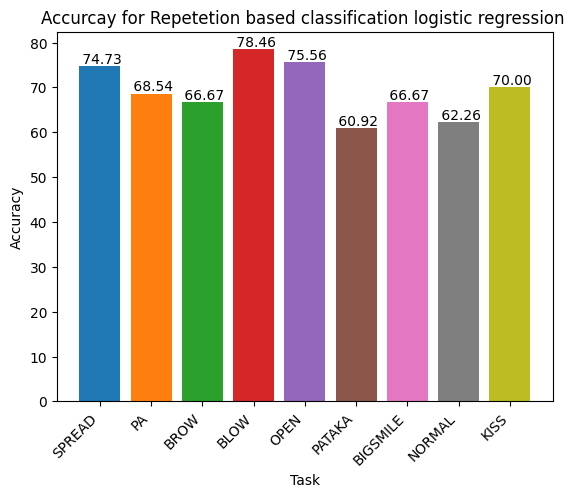

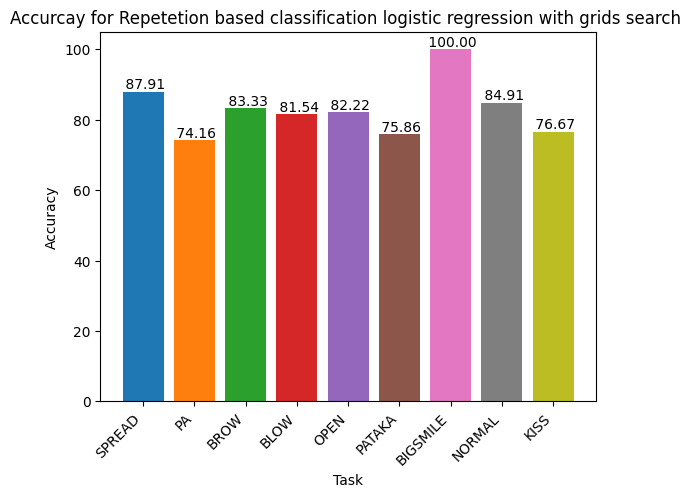

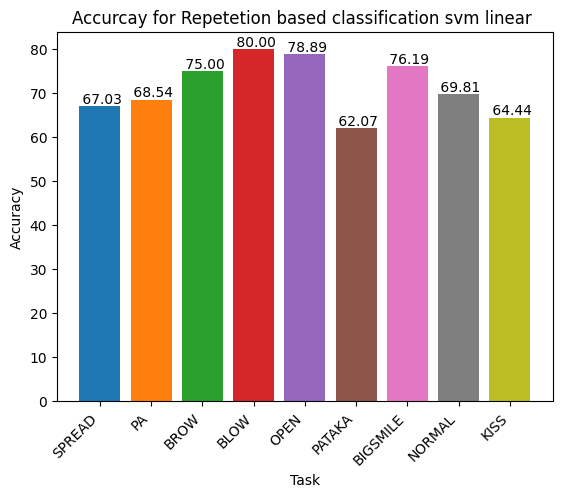

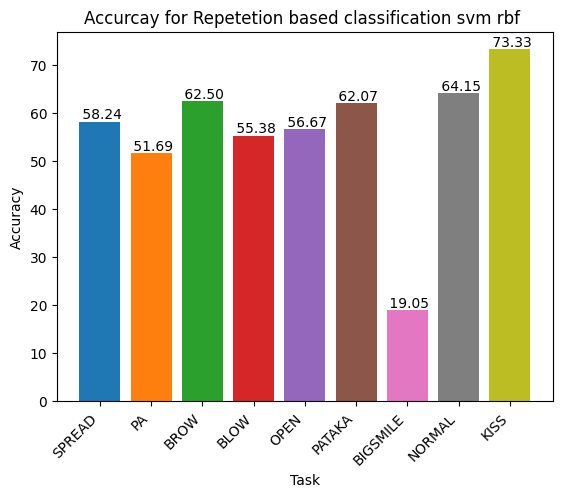

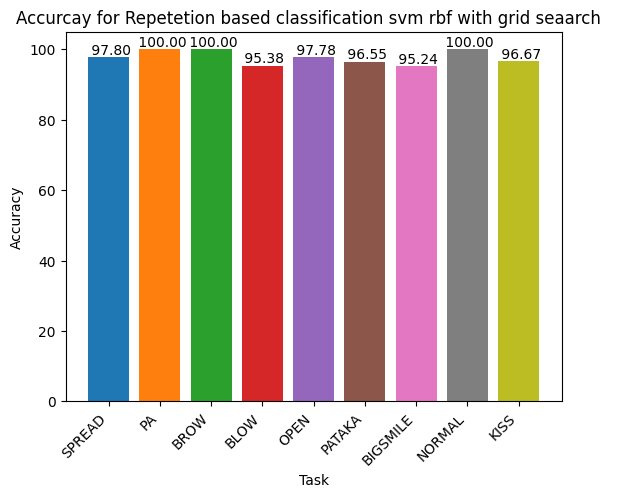

In [ ]:
result={'logistic regression':results_logistic,'logistic regression with grids search':results_logistic_grid,'svm linear':results,'svm rbf':results_svm_rbf,'svm rbf with grid seaarch ':results_svm_rbf_grid}
for name,i in result.items():
  for task, metrics in i.items():
    accuracy = metrics['Accuracy']*100
    plt.bar(task,accuracy)
    plt.text(task, accuracy, f' {accuracy:.2f}', ha='center', va='bottom')
    plt.xlabel('Task',)
  plt.ylabel('Accuracy')
  plt.xticks(rotation=45, ha='right')
  plt.title(f'Accurcay for Repetetion based classification {name} ')
  plt.show()

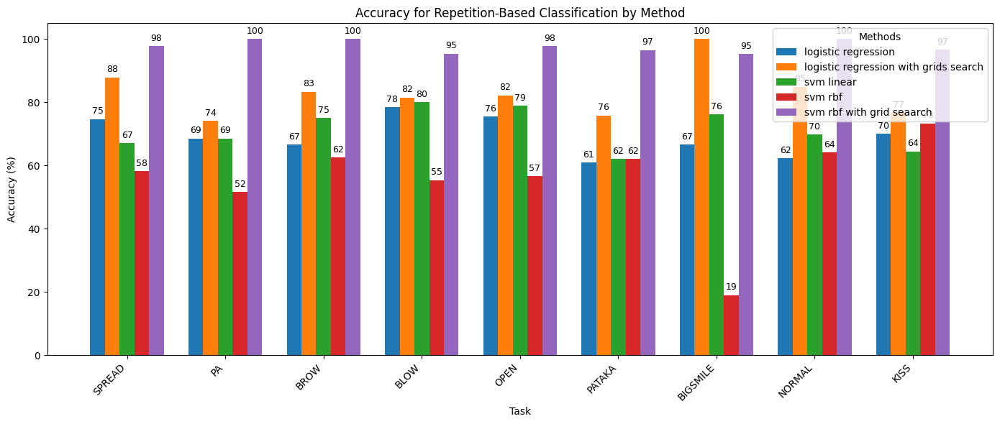

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Prepare data for grouped bar chart
tasks = next(iter(result.values())).keys()  # Extract task names from one result set
methods = result.keys()  # Extract method names

# Create a dictionary to store accuracies
task_accuracies = {task: [] for task in tasks}

# Populate the dictionary with accuracies for each method
for method_name, method_results in result.items():
    for task in tasks:
        accuracy = method_results[task]['Accuracy'] * 100
        task_accuracies[task].append(accuracy)

# Create a grouped bar chart
x = np.arange(len(tasks)) * 2  # Add spacing between tasks
width = 0.3  # Bar width

plt.figure(figsize=(14, 6))  # Adjust figure size

# Plot bars for each method
for i, method_name in enumerate(methods):
    accuracies = [task_accuracies[task][i] for task in tasks]
    bars = plt.bar(x + i * width, accuracies, width, label=method_name)

    # Add accuracy values on top of bars
    for bar, acc in zip(bars, accuracies):
        plt.text(bar.get_x() + bar.get_width() / 2, bar.get_height() + 1,
                 f'{acc:.0f}', ha='center', va='bottom', fontsize=9)

# Add labels, title, and legend
plt.xlabel('Task')
plt.ylabel('Accuracy (%)')
plt.title('Accuracy for Repetition-Based Classification by Method')
plt.xticks(x + width * (len(methods) - 1) / 2, tasks, rotation=45, ha='right')
plt.legend(title='Methods')

# Adjust layout to avoid overlapping
plt.tight_layout()

# Display the chart
plt.show()
